In [1]:
import zipfile
import os


zip_file_path = '/content/data.zip'
extract_folder = '/content/extracted_files'

os.makedirs(extract_folder, exist_ok=True)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

print(f"Files extracted to {extract_folder}")


Files extracted to /content/extracted_files


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

In [3]:
image_paths=[]
path=r'/content/extracted_files/data'
for imagefile in os.listdir(path):
    imagepath=os.path.join(path, imagefile)
    image_paths.append(imagepath)
image_paths[0:5]

['/content/extracted_files/data/18435.png',
 '/content/extracted_files/data/15543.png',
 '/content/extracted_files/data/7159.png',
 '/content/extracted_files/data/20866.png',
 '/content/extracted_files/data/12479.png']

In [4]:
len(image_paths)

21551

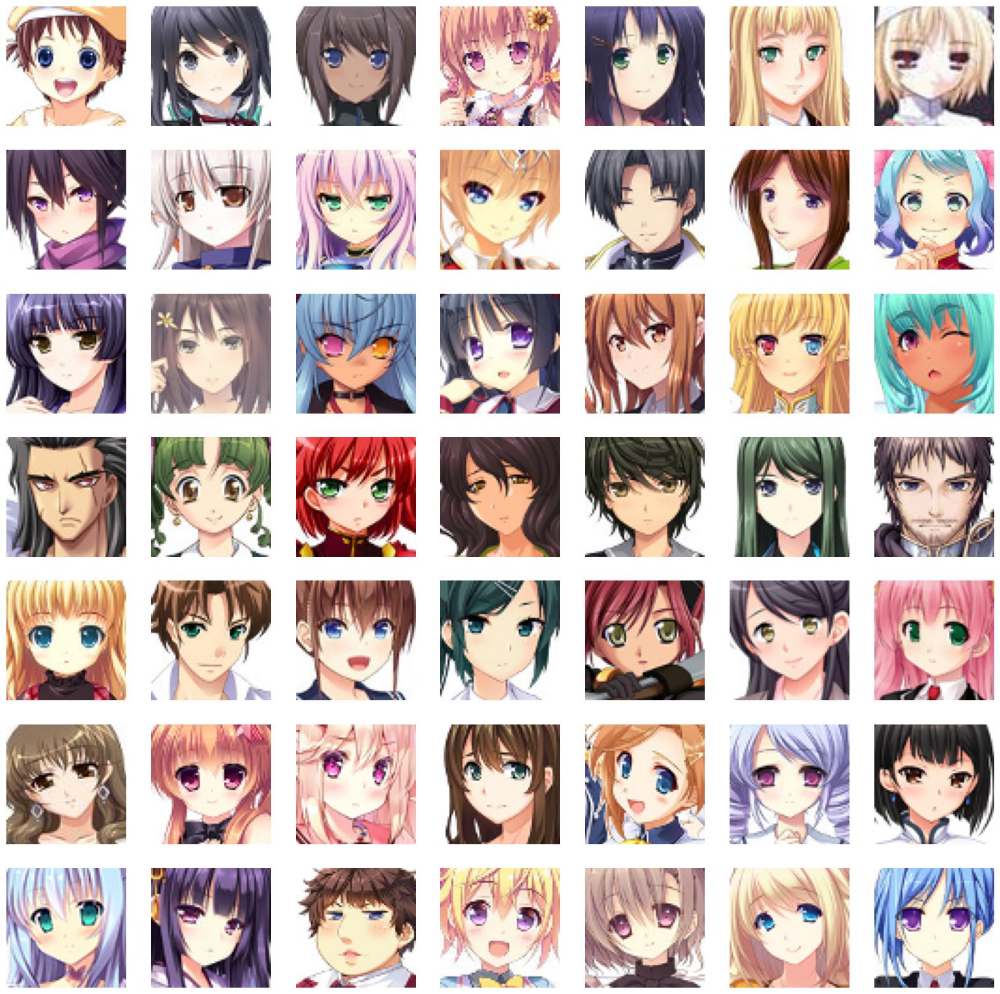

In [5]:
import random
plt.figure(figsize=(20,20))
start = random.randint(0, len(image_paths))
temp_images = image_paths[start:start+49]
index=1

for image_path in temp_images:
    plt.subplot(7,7, index)
    img=load_img(image_path)
    img=np.array(img)
    plt.imshow(img)
    plt.axis('Off')
    index+=1

In [6]:
train_images=[np.array(load_img(path)) for path in tqdm(image_paths)]
train_images=np.array(train_images)

  0%|          | 0/21551 [00:00<?, ?it/s]

In [7]:
train_images[0].shape

(64, 64, 3)

In [8]:
train_images=train_images.reshape(train_images.shape[0], 64,64, 3).astype('float32')

In [9]:
train_images = (train_images -127.5) / 127.5

In [10]:
train_images[0]

array([[[ 0.02745098, -0.6784314 , -0.5058824 ],
        [ 0.01960784, -0.7254902 , -0.46666667],
        [ 0.54509807, -0.29411766, -0.23137255],
        ...,
        [ 0.34117648, -0.39607844, -0.21568628],
        [-0.09803922, -0.77254903, -0.54509807],
        [-0.02745098, -0.78039217, -0.4745098 ]],

       [[-0.09019608, -0.78039217, -0.56078434],
        [ 0.12156863, -0.62352943, -0.40392157],
        [ 0.52156866, -0.38039216, -0.22352941],
        ...,
        [ 0.48235294, -0.27058825, -0.07450981],
        [-0.11372549, -0.827451  , -0.62352943],
        [-0.07450981, -0.79607844, -0.44313726]],

       [[-0.09803922, -0.78039217, -0.49803922],
        [ 0.2       , -0.5686275 , -0.34901962],
        [ 0.48235294, -0.4509804 , -0.20784314],
        ...,
        [ 0.48235294, -0.29411766, -0.08235294],
        [-0.01960784, -0.77254903, -0.5686275 ],
        [-0.05882353, -0.78039217, -0.4117647 ]],

       ...,

       [[ 0.35686275,  0.13725491,  0.14509805],
        [ 0

In [11]:
Latent_dim=100
weight_init=keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
channels=3

In [12]:
model = Sequential(name='generator')

model.add(layers.Dense(8*8*512, input_dim=Latent_dim))
model.add(layers.ReLU())
model.add(layers.Reshape((8,8,512)))
model.add(layers.Conv2DTranspose(256,(4,4), strides=(2,2), padding='same', kernel_initializer=weight_init))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(128,(4,4), strides=(2,2), padding='same', kernel_initializer=weight_init))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(64,(4,4), strides=(2,2), padding='same', kernel_initializer=weight_init))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(channels,(4,4),  padding='same', activation='tanh'))
generator=model
generator.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 32768)               │       3,309,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           3,075 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,065,603 (23.14 MB)

 Trainable params: 6,065,603 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
model = Sequential(name='descriminator')
input_shape=(64, 64, 3)
alpha=0.2

model.add(layers.Conv2D(64, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4,4), strides=(2,2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

model.add(layers.Dense(1, activation='sigmoid'))

descriminator=model
descriminator.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "descriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 128)           │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

In [14]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator =generator
        self.discriminator=discriminator
        self.latent_dim=latent_dim
        self.g_loss_metric=keras.metrics.Mean(name='g_loss')
        self.d_loss_metric=keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer=g_optimizer
        self.d_optimizer=d_optimizer
        self.loss_fn=loss_fn

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        random_noise=tf.random.normal(shape=(batch_size, self.latent_dim))

        with tf.GradientTape() as tape:
            pred_real =self.discriminator(real_images, training=True)
            real_labels=tf.ones((batch_size, 1))
            real_labels+=0.05*tf.random.uniform(tf.shape(real_labels))
            d_loss_real=self.loss_fn(real_labels, pred_real)

            fake_images =self.generator(random_noise)
            pred_fake =self.discriminator(fake_images, training=True)
            fake_labels=tf.zeros((batch_size, 1))
            d_loss_fake=self.loss_fn(fake_labels, pred_fake)

            d_loss=(d_loss_real+d_loss_fake)/2

        gradient=tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(gradient, self.discriminator.trainable_variables))

        labels=tf.ones((batch_size, 1))

        with tf.GradientTape() as tape:
            fake_images=self.generator(random_noise, training=True)
            pred_fake=self.discriminator(fake_images, training =True)
            g_loss=self.loss_fn(labels, pred_fake)

        gradient=tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gradient, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss':self.d_loss_metric.result(), 'g_loss':self.g_loss_metric.result()}

In [15]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs =num_imgs
        self.latent_dim=latent_dim
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        g_img=self.model.generator(self.noise)
        g_img=(g_img*127.5)+127.5
        g_img.numpy()
        fig=plt.figure(figsize=(8,8))
        for i in range(self.num_imgs):
            plt.subplot(5,5,i+1)
            img=array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [16]:
dcgan=DCGAN(generator=generator, discriminator=descriminator, latent_dim=Latent_dim)

D_LR =0.0001
G_LR =0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())


Epoch 1/15
674/674 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - d_loss: 1.2469 - g_loss: 1.8725

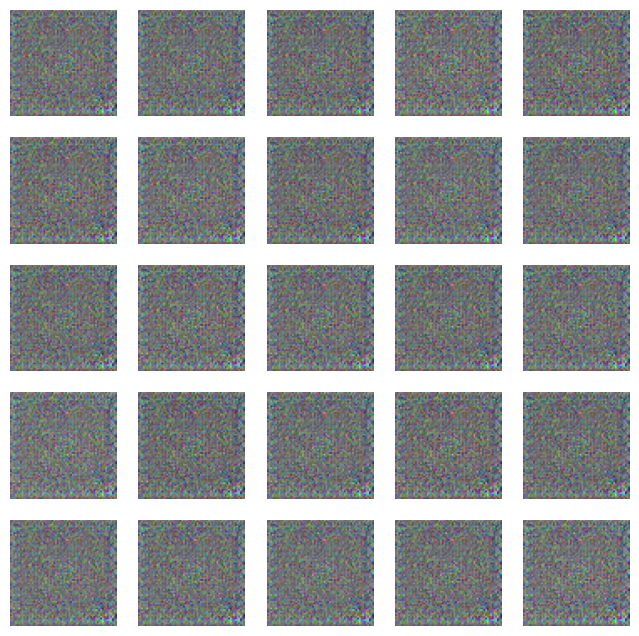

674/674 ━━━━━━━━━━━━━━━━━━━━ 74s 82ms/step - d_loss: 1.2459 - g_loss: 1.8738
Epoch 2/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - d_loss: 0.1744 - g_loss: 3.3262

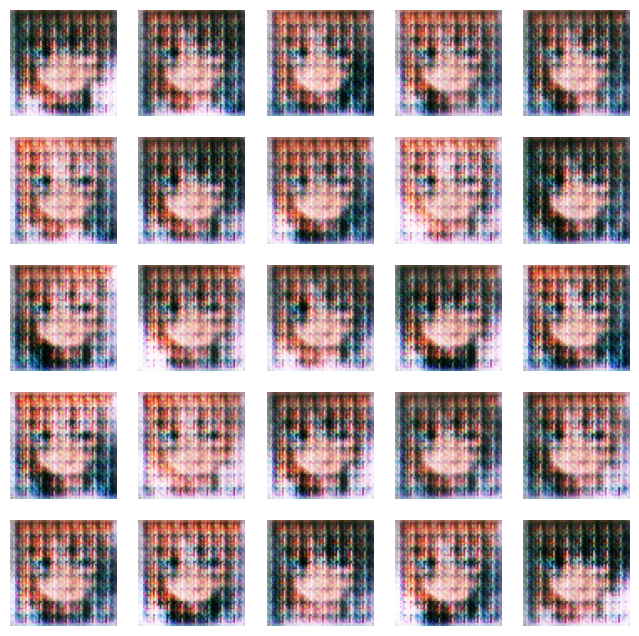

674/674 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - d_loss: 0.1750 - g_loss: 3.3243
Epoch 3/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - d_loss: 0.5700 - g_loss: 1.8237

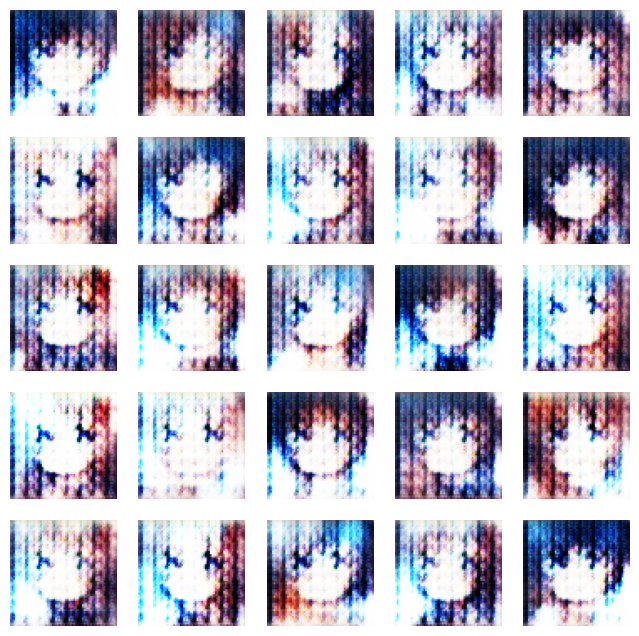

674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step - d_loss: 0.5699 - g_loss: 1.8239
Epoch 4/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - d_loss: 0.5949 - g_loss: 1.8371

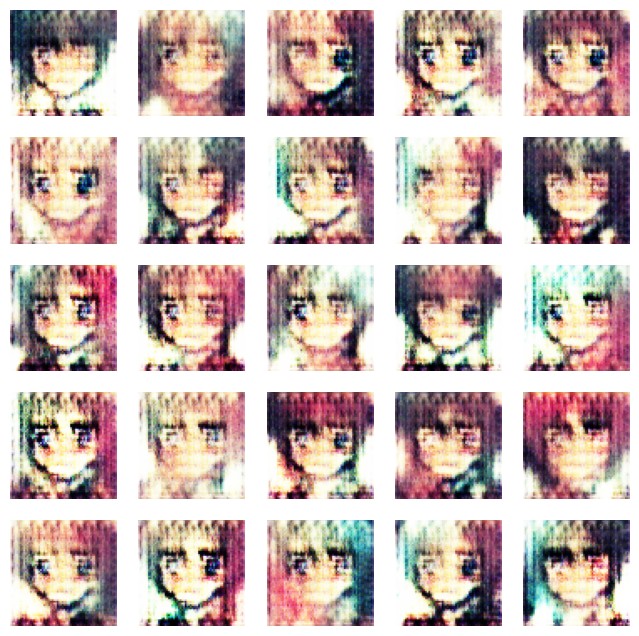

674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - d_loss: 0.5949 - g_loss: 1.8371
Epoch 5/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - d_loss: 0.5794 - g_loss: 1.8783

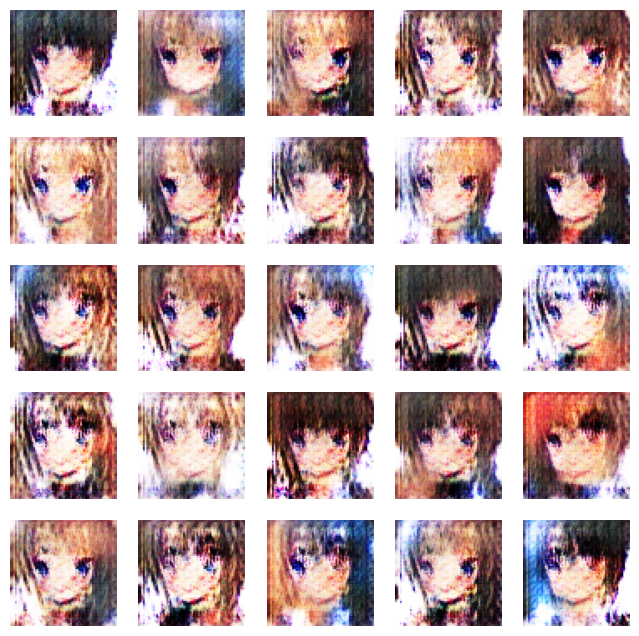

674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step - d_loss: 0.5794 - g_loss: 1.8781
Epoch 6/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - d_loss: 0.5725 - g_loss: 1.8704

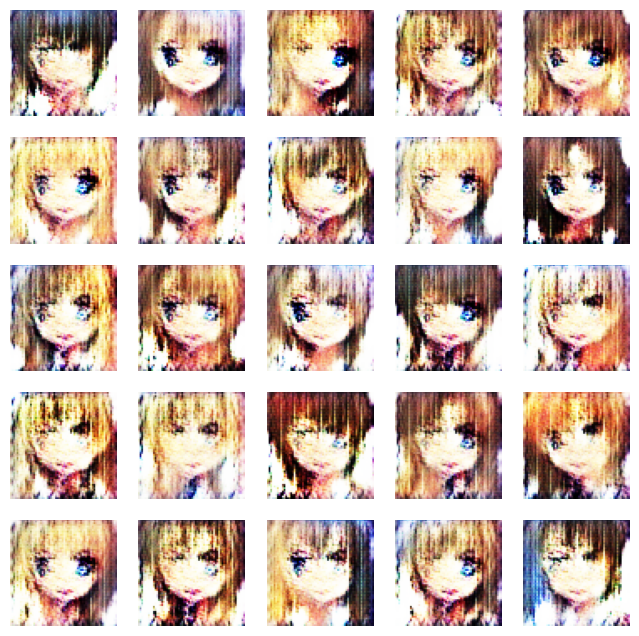

674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - d_loss: 0.5725 - g_loss: 1.8704
Epoch 7/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - d_loss: 0.5650 - g_loss: 1.7073

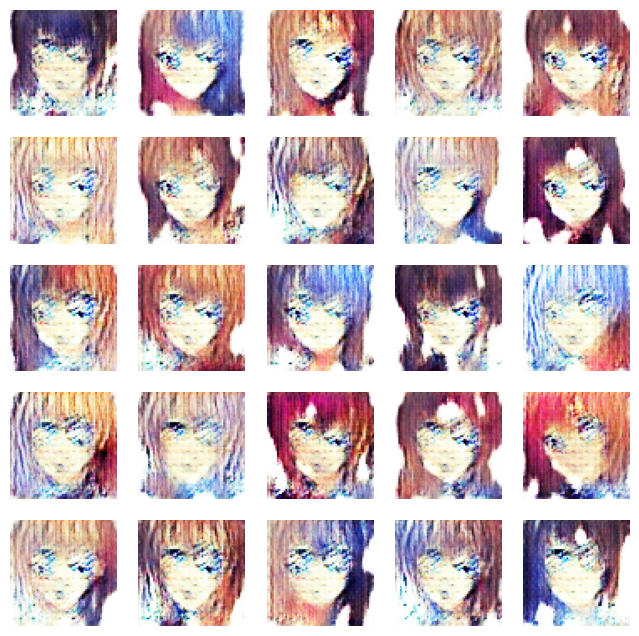

674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step - d_loss: 0.5649 - g_loss: 1.7074
Epoch 8/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - d_loss: 0.5235 - g_loss: 1.8667

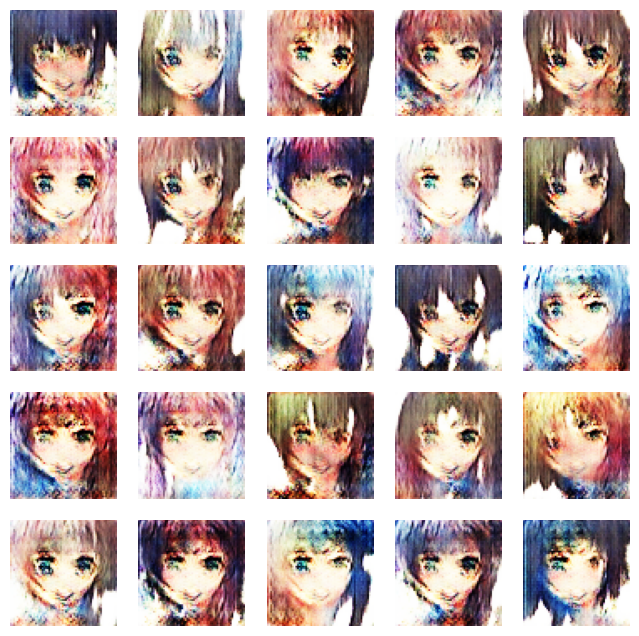

674/674 ━━━━━━━━━━━━━━━━━━━━ 39s 57ms/step - d_loss: 0.5235 - g_loss: 1.8664
Epoch 9/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - d_loss: 0.5242 - g_loss: 1.6652

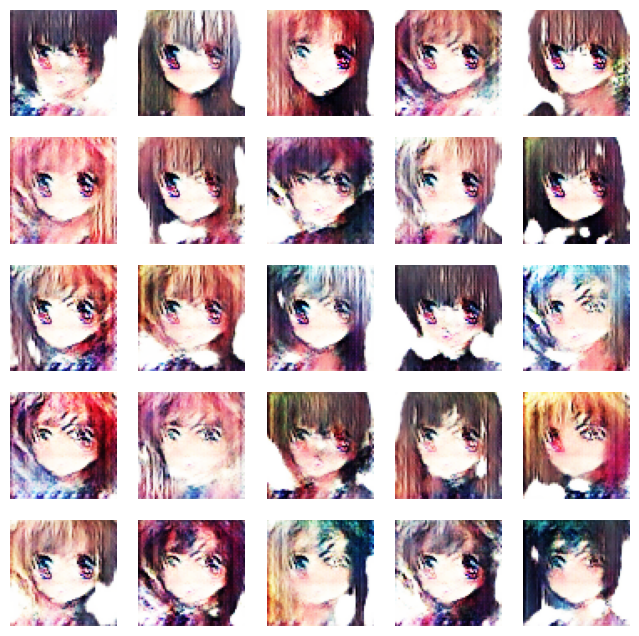

674/674 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - d_loss: 0.5242 - g_loss: 1.6653
Epoch 10/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - d_loss: 0.5107 - g_loss: 1.8017

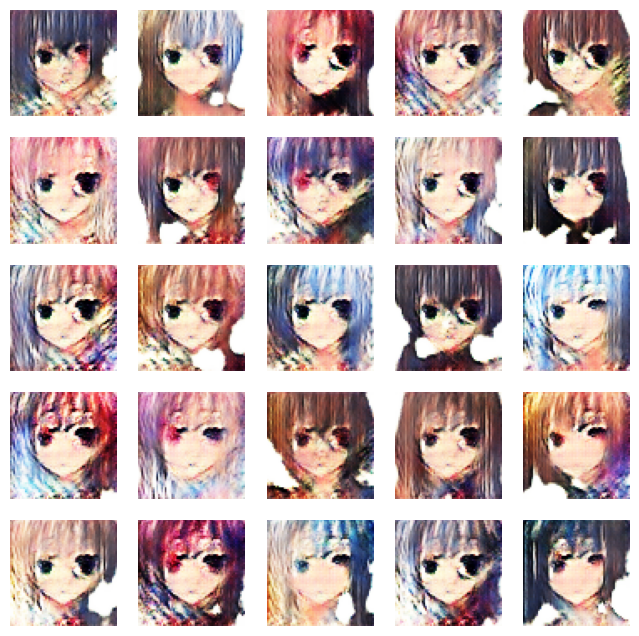

674/674 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step - d_loss: 0.5106 - g_loss: 1.8018
Epoch 11/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - d_loss: 0.4896 - g_loss: 1.8460

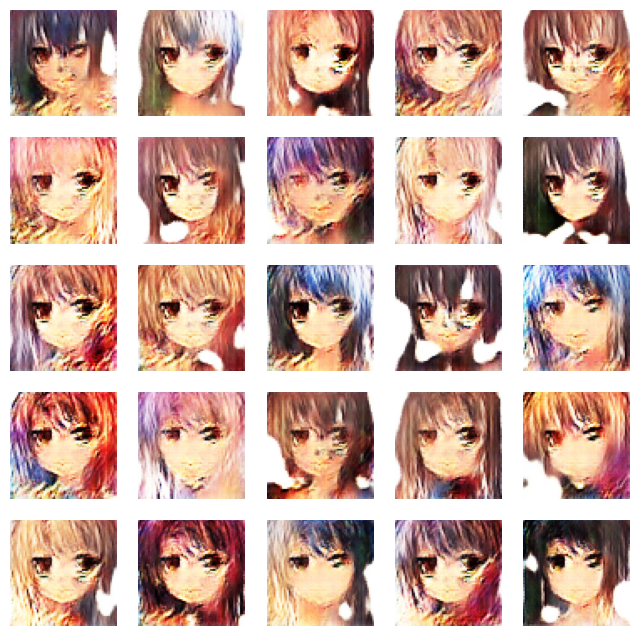

674/674 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - d_loss: 0.4896 - g_loss: 1.8460
Epoch 12/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.4973 - g_loss: 1.8604

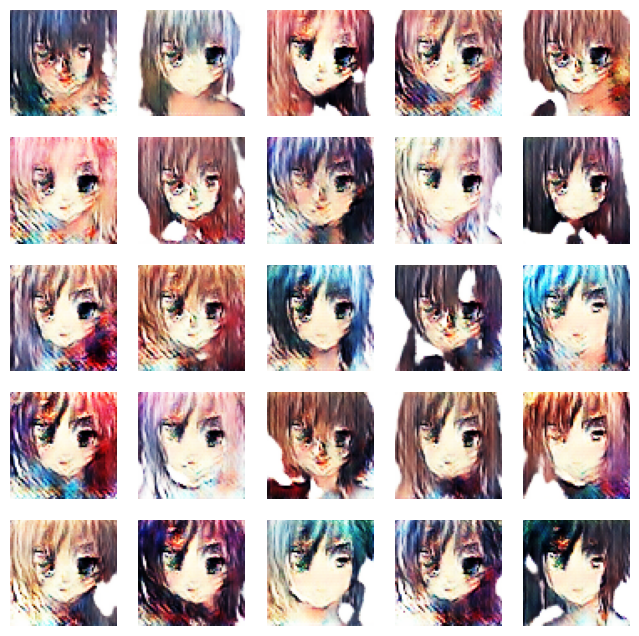

674/674 ━━━━━━━━━━━━━━━━━━━━ 81s 65ms/step - d_loss: 0.4972 - g_loss: 1.8604
Epoch 13/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - d_loss: 0.4726 - g_loss: 1.9327

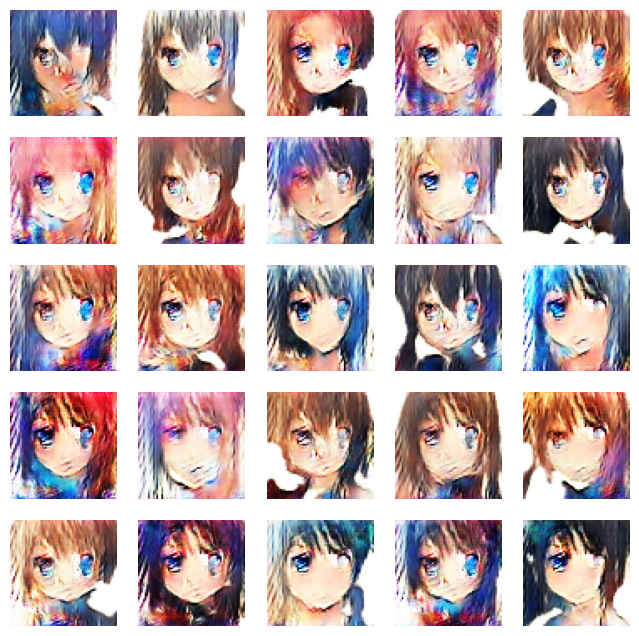

674/674 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - d_loss: 0.4726 - g_loss: 1.9327
Epoch 14/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - d_loss: 0.4626 - g_loss: 1.8932

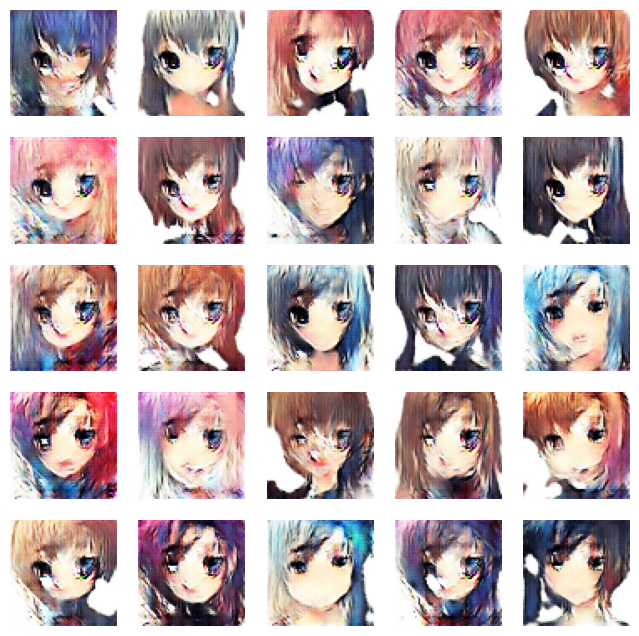

674/674 ━━━━━━━━━━━━━━━━━━━━ 79s 60ms/step - d_loss: 0.4626 - g_loss: 1.8933
Epoch 15/15
673/674 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - d_loss: 0.4530 - g_loss: 1.9246

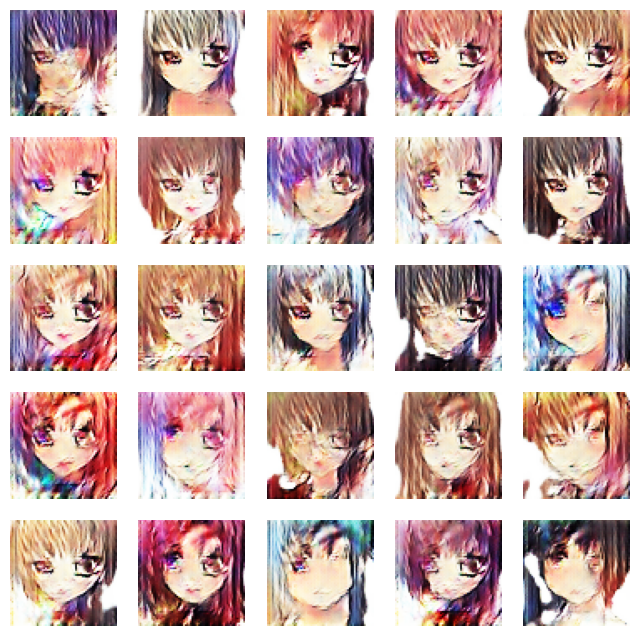

674/674 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - d_loss: 0.4529 - g_loss: 1.9247


In [17]:
n_epochs=15
dcgan.fit(train_images, epochs=n_epochs, callbacks=[DCGANMonitor()])

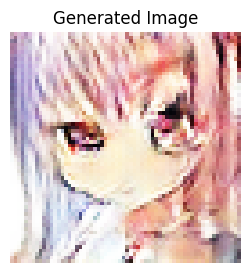

In [18]:
noise=tf.random.normal([1,100])
fig=plt.figure(figsize=(3,3))
g_img=dcgan.generator(noise)
g_img=(g_img*127.5)+127.5
g_img.numpy()
img=array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.title('Generated Image')
plt.show()